# First assessment of the algorithm

In [1]:
using Revise
using Pkg
Pkg.activate("../mpr_atbd_env_jl")
#Pkg.develop(path="../algorithm/OEM")
includet("../algorithm/src/OEM_with_SIT.jl")
includet("../algorithm/src/IOutils.jl")
using .OEM
#Pkg.activate("/Users/huntemann/from_janna/")

  Activating project at `~/MultiParameter_ATBD/mpr_atbd_env_jl`


In [2]:
using CSV
using DataFrames
using HDF5
using Dates
using Statistics
using StaticArrays
using ForwardDiff
using LinearAlgebra
using BenchmarkTools
#using Inversion
#using PyCall

#using ProgressMeter
#@pyimport cartopy.crs as ccrs

In [3]:
using PythonCall
mpl=pyimport("matplotlib")
#mpl.use("agg")
mpl.use("module://juliacall.matplotlib")
plt=pyimport("matplotlib.pyplot")
ccrs=pyimport("cartopy.crs")
pr=pyimport("pyresample")
llur=getindex.(Ref(nsidcg.area_extent),[0,2,1,3])
cfeature=pyimport("cartopy.feature")
mycrs=nsidcg.to_cartopy_crs();
target_crs=ccrs.LambertAzimuthalEqualArea(central_latitude=90,central_longitude=0)

Python LambertAzimuthalEqualArea:
<Derived Projected CRS: +proj=laea +ellps=WGS84 +lon_0=0 +lat_0=90 +x_0=0. ...>
Name: unknown
Axis Info [cartesian]:
- E[south]: Easting (metre)
- N[south]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Lambert Azimuthal Equal Area
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [4]:
D=Date(2021,11,10)
if filesize("../data/oem_input.h5")>0
    outg = h5read("../data/oem_input.h5","/TBS_14") |> x->[x[:,:,i] for i in 1:size(x,3)]
    wsp,twv,clw,t2m,tsk=h5read("../data/oem_input.h5","/era5") |> x->[x[:,:,i] for i in 1:size(x,3)]
else
    wsp,twv,clw,t2m,tsk=get_ecmwf_on_NSIDC(D) 
    outg=prepare_oem_tbs(D);
    h5write("../data/oem_input.h5","/TBS_14",cat(outg...,dims=3))
    h5write("../data/oem_input.h5","/era5",cat(wsp,twv,clw,t2m,tsk,dims=3))
end

5-element Vector{Matrix{Float64}}:
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

In [37]:
get_Sg(ii)=[wsp[ii] twv[ii] clw[ii] tsk[ii] t2m[ii] 0.5 0.5 100 35]



function run_oem(outg,wsp,twv,clw,t2m,tsk,D;
        routine=:old)

    dat=[fill(NaN,size(wsp)) for i=1:9]
    err=[fill(NaN,size(wsp)) for i=1:9]
    res=[fill(NaN,size(wsp)) for i=1:14]

    S_e = Diagonal([ 5.0,   5.0,    #1.4v,h
                2.356, 4.832,  #6.9v,h
                1.609, 5.460,  #10.6v,h
                0.977, 4.932,  #18.7v,h
                #1.042, 2.661,  #23.8v,h
                200+1.042,200+ 2.661,  #23.8v,h
                2.540, 2.65, # 36.5v,h
                200+4.903, 200+6.274].^2) #89v,h
                #4.903, 6.274].^2) #89v,h

    S_p = Diagonal([5.6048, #wsp
                    5.0962, #twv
                    #0.0204, #clw
                    0.2, #clw
                    5.8936, #sst
                    5.9468, #ist
                    0.3, #ic #good guess when initial value from TBs
                    0.3, #myif # good guess when initial value from TBs
                    100.0, #sit
                    5 # sss
                    ].^2) #sit [cm]
    
    for ii in eachindex(wsp)
        if (isnan(outg[1][ii]) | isnan(outg[3][ii]) | (t2m[ii]==0))
            continue
        end

        TBs=[outg[i][ii] for i =1:14]
        #without using the TBs
        Sg=[wsp[ii],twv[ii],clw[ii],tsk[ii],t2m[ii],0.5,0.5,100,30]
        #including the TBs for guessing
        Sg=calc_pa(TBs,Sg)

 
        if routine==:old
            a,c,b= inv_function_apri_ice_lm(TBs',S_e,S_p,1,Sg')
        else
             a,c,b=lm_retrieval(TBs,S_e,S_p,Sg,fw_fnct_amsre)
             c=diag(c)#clamp.(diag(c),(0,),(1000,))
        end
        for i=1:9
            dat[i][ii]=a[i]
            err[i][ii]=sqrt(c[i])
        end
        for i=1:14
            res[i][ii]=b[i]
        end


    end
    return dat,err,res
end


function do_all_date(D)    
    wsp,twv,clw,t2m,tsk=get_ecmwf_on_NSIDC(D)
    outg=prepare_oem_tbs(D)
    
    dat,res=run_oem(outg,wsp,twv,clw,t2m,tsk,D)
    plot_oem_out(dat,D,true)
    plot_oem_res(res,D,true)
end




    

do_all_date (generic function with 1 method)

In [39]:
function plot_oem_out(dat,D,save=false)
    dat=deepcopy(dat)
    fig,ax=plt.subplots(nrows=3,ncols=3,figsize=[15,15], subplot_kw=PyDict(Dict("projection"=> mycrs)))
    ax=pyconvert(Array,ax)

    mins=[0,0,0,240,240,0,0,0,25]
    maxs=[20,20,.5,280,280,1,1,150,40]
    labs=["windspeed [m/s]","total water vapor [kg/m²]","cloud liquid water [kg/m²]",
    "sea surface temperature [K]","ice surface temperature [K]","sea ice concentration [1]",
    "multi year ice fraction [1]","first year ice thickness [cm]","sea surface salinity [ppt]"]
    sic=dat[6]

    dat[1][sic.>0.9].=NaN
    dat[4][sic.>0.9].=NaN
    dat[5][sic.<0.1].=NaN
    dat[7][sic.<0.1].=NaN
    dat[8][sic.<0.1].=NaN
    dat[9][sic.>0.9].=NaN

    extent=[-3,3,-3,3].*1e6

    cm=plt.cm.gist_ncar
    cm.set_bad("grey")

    size(dat[1])
    for i=1:9
        pos=ax[i].imshow(dat[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm,transform=mycrs)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end
    #ax[10].set_visible(false)
    plt.subplots_adjust(wspace=0.01,hspace=0.01)
    if save
        plt.savefig("outmaps/oem_sit_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
    end
    return fig
end

function plot_oem_err(dat,D,save=false)
    dat=deepcopy(dat)
    fig,ax=plt.subplots(nrows=3,ncols=3,figsize=[15,15],subplot_kw=PyDict(Dict("projection"=> mycrs)))
    ax=pyconvert(Array,ax)

    mins=[0,0,0,0,0,0,0,0,0]
    maxs=[20,20,1,15,15,0.1,0.1,150,5]
    labs=["windspeed [m/s]","total water vapor [kg/m²]","cloud liquid water [kg/m²]","sea surface temperature [K]","ice surface temperature [K]","sea ice concentration [1]","multi year ice fraction [1]","first year ice thickness [cm]","sea surface salinity [ppt]"]
    #sic=dat[6]

    #dat[1][sic.>0.9].=NaN
    #dat[4][sic.>0.9].=NaN
    #dat[5][sic.<0.1].=NaN
    #dat[7][sic.<0.1].=NaN
    #dat[8][sic.<0.1].=NaN

    extent=[-3,3,-3,3].*1e6

    cm=plt.cm.gist_ncar
    cm.set_bad("grey")

    size(dat[1])
    for i=1:9
        pos=ax[i].imshow(dat[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end
    #ax[10].set_visible(false)
    plt.subplots_adjust(wspace=0.01,hspace=0.01)

    if save
        plt.savefig("outmaps/oem_sit_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
    end
    return fig
end

function plot_oem_res(res,D,save=false,cimr_only=true)
    cols=cimr_only ? 5 : 7
    fig,ax=plt.subplots(nrows=2,ncols=cols,figsize=[20,10],subplot_kw=PyDict(Dict("projection"=> mycrs)))
    ax=pyconvert(Array,ax)
    mins=fill(-10,14)
    maxs=fill(10,14)
    if cimr_only
        freqs=[1.4,6.93, 10.65, 18.70, 36.50]        
    else
        freqs=[1.4,6.93, 10.65, 18.70, 23.80, 36.50, 89.0]
    end
    
    labs=["$(freqs[(i+1)÷2])$(["h","v"][(i)%2+1])" for i=1:(cols*2)]
    sic=dat[6]

    extent=[-3,3,-3,3].*1e6
    cm=plt.cm.bwr
    cm.set_bad("grey")
    for i=1:(cols*2)
        pos=ax[i].imshow(res[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.8,orientation="horizontal",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end

    plt.subplots_adjust(wspace=0.01,hspace=0.01)

    if save
        plt.savefig("outmaps/oem_sit_res_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
        return nothing
    end
    return fig
end

plot_oem_res (generic function with 3 methods)

In [40]:

@time dat,err,res=run_oem(outg,wsp,twv,clw,t2m,tsk,D,routine=:new);

We apply the algorithm to the daily averaged {term}`SMOS` and {term}`AMSR2` data
for the 10 November 2021. For AMSR2 we exclude the 23 and 89 GHz channels from
the calculation as it is not available on the {term}`CIMR` satellite.
The retrieval is constrained using a priori information from {term}`ERA5` in
particular for the atmospheric parameters. The Figure below shows the results of the retrieval with maps of all eight parameters. Some parameters like the {term}`SIC` are strongly constrained from the input and thus look very consistent. The {term}`MYIF` shows artifacts along the ice edge, in particular in the Fram Strait but also in the Kara and Barents Seas. The {term}`SIC` seems very low, but also it is only showing the ice thickness of the fraction of first year ice. Even though the higher multi year ice fraction parts have values of ice thickness, it is less reliable. 
The atmospheric parameters and the windspeed are fast changing parameters. Therefore, the daily averaged brightness temperature input may alter the results and let swath edges shine through the results.




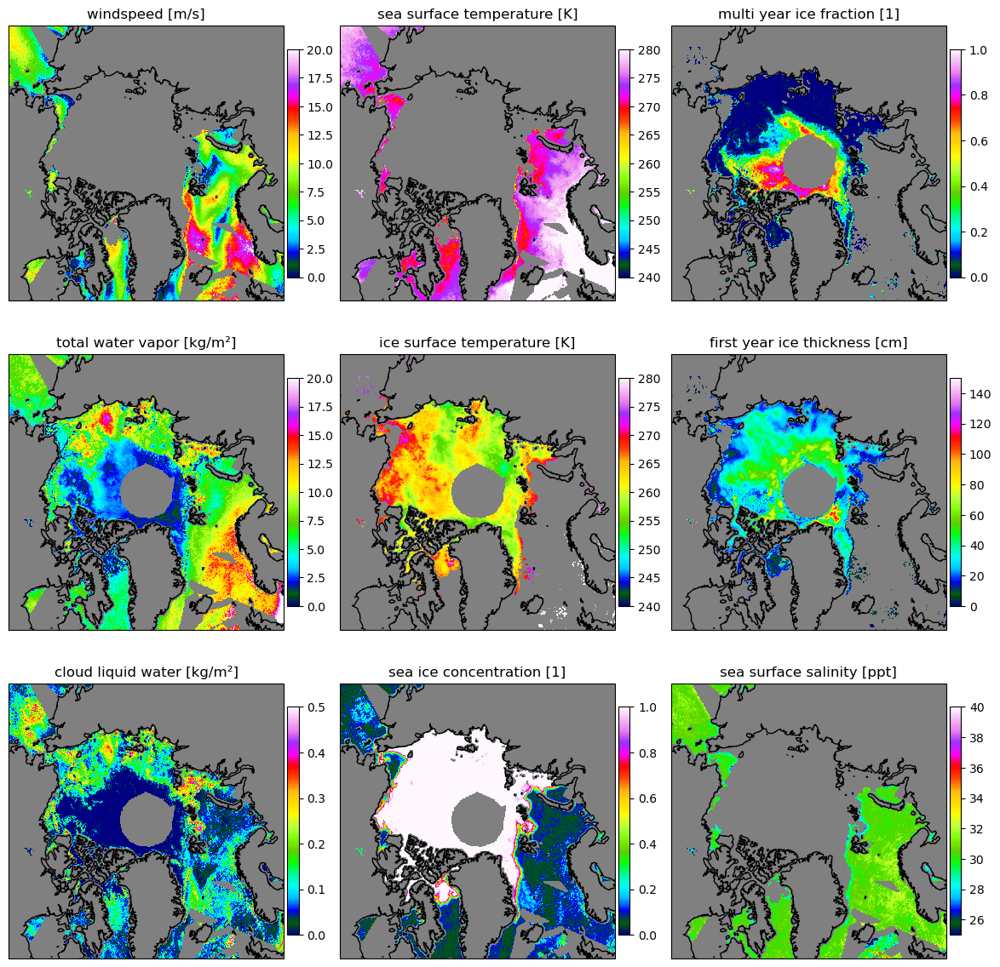

In [41]:
plot_oem_out(dat,D,true)

Looking at the uncertainties of the retrieved quantities it seems that the retrieval improved the knowledge in many cases. The apri ori uncertainty is always corresponding the highest values in the plot. For example, the a priori uncertainty of wind speed was set to 10~m/s. Since Windspeed cannot be retrieved over 100% Sea ice, the entire ice area has a wind speed uncertainty of 10~m/s. Over ocean hower this value goes down to values of nearly 2~m/s unceartainty. This means our knowledge about the wind speed in these areas increased drastically by this measurement. Our knowledge about the SSS barely increased with the measurement, which could indicate an inconsistency in the forward model.

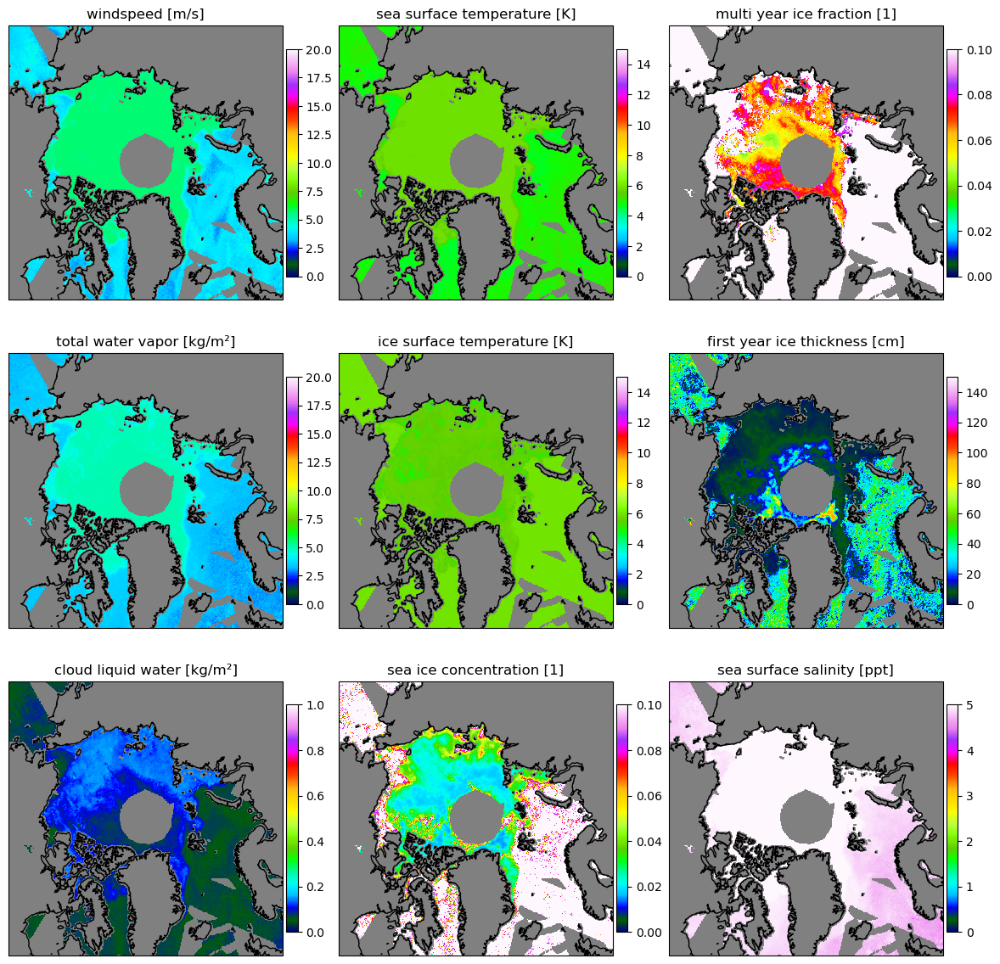

In [42]:
plot_oem_err(err,D)

Another output of the retrieval are the brightness temperatures of the best estimate of the parameters. With this information, the result vector of brightness temperatures can be compared to the input vector, i.e., the observed brightness temperatures from the instrument. With a good working forward model, it is expected that the differences of the brightness temperatures in each channel are small. In the Figure below, at vertical polariztaion (upper row) the forward model solution looks very similar to the measurement from the instrument, except for L-band. At horizontal polarization (lower row), strong discrepencies, especially over Sea ice can be seen. Comparing the pattern to the geophysical quantities from the first Figure, it is evident that the first year ice areas cause a major problem in the forward model. The retrieved state is not very consistent for this date. 

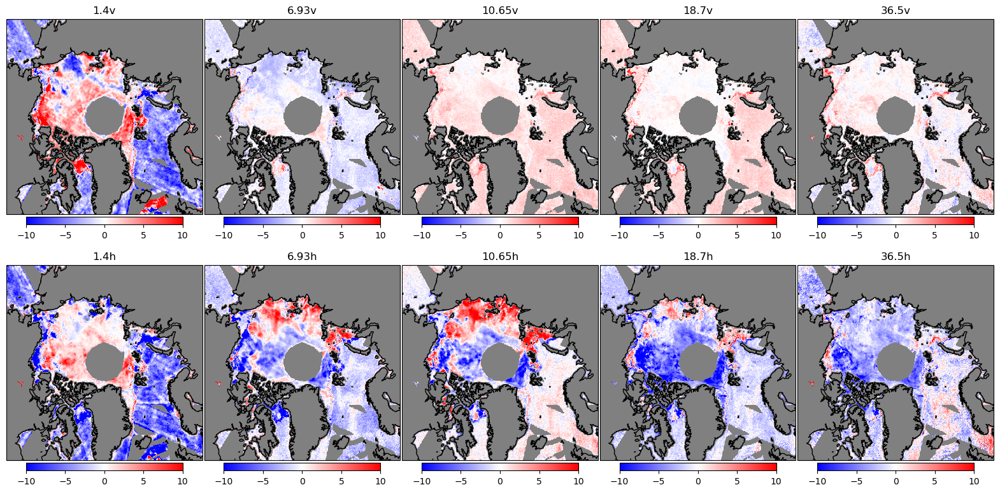

In [43]:
fig=plot_oem_res(res,D,false,true)

In [25]:
#@btime fw_fnct_amsre([0.2,2,0.1,278,270,0.1,0.9,1.0])

  4.619 μs (14 allocations: 1008 bytes)


14-element Vector{Float64}:
 153.38394129177303
  81.05005068630688
 166.4943736566543
  86.81755031724947
 171.17145243236845
  90.23321208135344
 182.95988104358324
 101.34323382593789
 191.45139081049845
 111.85909430742225
 207.47500049020914
 133.10005855896878
 241.83505242174675
 186.88245839089737

In [26]:
ch=["$i$p" for i in [1.4,6.9, 10.7, 18.7, 23.80, 36.50, 89.0] for p in ["v","h"]]

14-element Vector{String}:
 "1.4v"
 "1.4h"
 "6.9v"
 "6.9h"
 "10.7v"
 "10.7h"
 "18.7v"
 "18.7h"
 "23.8v"
 "23.8h"
 "36.5v"
 "36.5h"
 "89.0v"
 "89.0h"

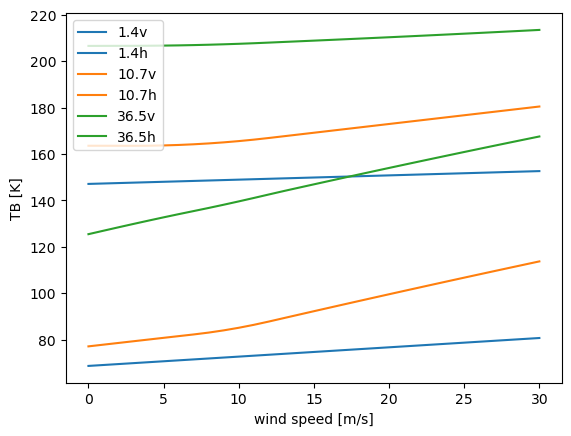

In [27]:
fig=plt.figure()
cs=[1,2,5,6,11,12]
for c in 1:6
plt.plot([getindex(fw_fnct_amsre([i,0.2,0.1,278,270,0.001,1.0,80,35]),cs[c]) for i=0:1:30],label=ch[cs[c]],color="C$((c-1)÷2)")
end
plt.legend()
#plt.ylim(200,300)
plt.ylabel("TB [K]")
plt.xlabel("wind speed [m/s]")
fig

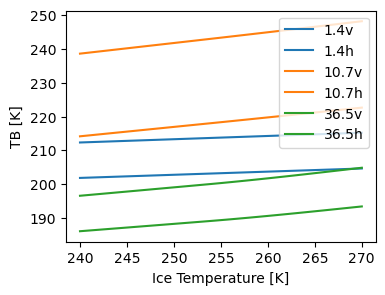

In [28]:
fig=plt.figure(figsize=[4,3  ])
cs=[1,2,5,6,11,12]
prange=240:270
for c in 1:6
plt.plot(prange,[getindex(fw_fnct_amsre([2,0.2,0.1,278,i,1.0,1.0,80,35]),cs[c]) for i=prange],label=ch[cs[c]],color="C$((c-1)÷2)")
end
plt.legend()
#plt.ylim(200,300)
plt.ylabel("TB [K]")
plt.xlabel("Ice Temperature [K]")
fig

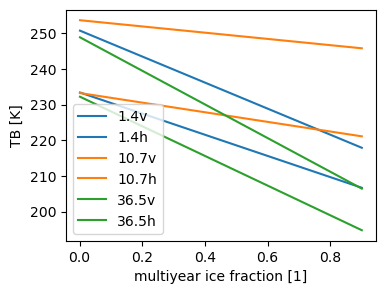

In [29]:
fig=plt.figure(figsize=[4,3])
cs=[1,2,5,6,11,12]
prange=0.001:0.1:1.0
for c in 1:6
plt.plot(prange,[getindex(fw_fnct_amsre([2,0.2,0.1,278,260,1.0,i,80,35]),cs[c]) for i=prange],label=ch[cs[c]],color="C$((c-1)÷2)")
end
plt.legend()
#plt.ylim(200,300)
plt.ylabel("TB [K]")
plt.xlabel("multiyear ice fraction [1]")
fig

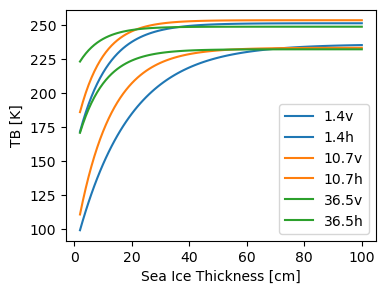

In [ ]:
fig=plt.figure(figsize=[4,3])
cs=[1,2,5,6,11,12]
prange=2:1:100.0
for c in 1:6
plt.plot(prange,[getindex(fw_fnct_amsre([2,0.2,0.1,278,260,1.0,0.0,i,35]),cs[c]) for i=prange],label=ch[cs[c]],color="C$((c-1)÷2)")
end
plt.legend()
#plt.ylim(200,300)
plt.ylabel("TB [K]")
plt.xlabel("Sea Ice Thickness [cm]")
fig

In [119]:
fw_fnct_amsre([10,0.2,0.1,273,270,0.000001,1.0,0.1,39])

14-element Vector{Float64}:
 144.64445563698828
  68.7656222180882
 157.7898500250851
  79.39123546346629
 164.14244230902972
  84.75091149141436
 179.6631477444441
 100.69139043211493
 188.71869399130162
 111.5203311012001
 208.37261378616228
 141.47905772512567
 238.54809759345068
 189.05982922268922